In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as func

import numpy as np
from PIL import Image as im
from IPython.display import Image, display

torch.backends.cudnn.benchmark = True
torch.cuda.empty_cache()
torch.set_default_tensor_type('torch.cuda.FloatTensor')

In [2]:
class cca(torch.nn.Module):
    def __init__(self, _kern, _act, _dev='cuda'):
        super().__init__()
        self.kern = _kern
        self.act = _act
        self.dev = _dev
        self.frames = []
        
    def per_channel_conv(self, _x, _kerns):
        batch_size, channels, height, width = _x.shape
        y = _x.reshape(batch_size*channels, 1, height, width)
        y = func.pad(y, (1, 1, 1, 1), 'circular')
        _kerns = _kerns.to(self.dev)
        y = y.to(self.dev)
        y = func.conv2d(y, _kerns[:, None])
        y = y.reshape(batch_size, -1, height, width)
        return y
    
    def forward(self, _x):
        x = self.per_channel_conv(_x, self.kern)
        v = self.act(x)
        v = torch.clamp(v, 0.0, 1.0)
        return v
    
    def seed(self, _w, _h, _batch=1, _chan=1):
        return torch.rand(_batch, _chan, _h, _w).to(self.dev)
    
    def add_frame(self, _x):
        _, _, h, w = _x.shape
        x = _x[0]
        x = x.repeat(3, 1, 1)
        x = x.permute([1, 2, 0])
        x = np.uint8(x.detach().cpu()*255)
        img = im.fromarray(x)
        img = img.resize((w*8, h*8), im.Resampling.BOX)
        self.frames.append(img)
        
    def create_gif(self):
        self.frames[0].save('res.gif', save_all=True,optimize=False, append_images=self.frames[1:], loop=0)
        display(Image(data=open('res.gif','rb').read(), format='png'))

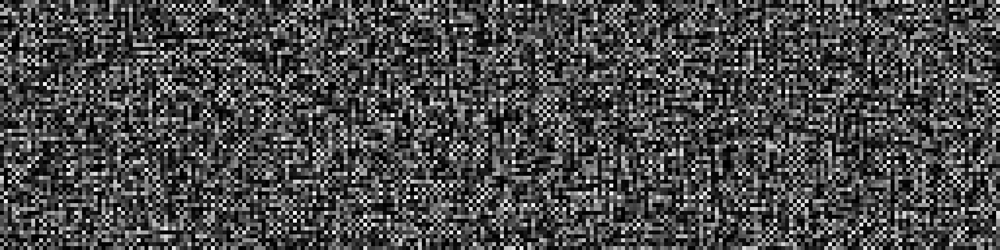

In [3]:
kern = torch.Tensor([[0.68, -0.9, 0.68], [-0.9, -0.66, -0.9], [0.68, -0.9, 0.68]]).unsqueeze(0)
act = lambda x : -1.0 / torch.pow(2.0, (0.6*torch.pow(x, 2.0))) + 1.002
w = 256
h = 64

worms_cca = cca(kern, act)

seed = worms_cca.seed(w, h)

x = seed
for i in range(256):
    x = worms_cca.forward(x)
    if i % 4 == 0:
        worms_cca.add_frame(x)
worms_cca.create_gif()

In [20]:
class ncca(torch.nn.Module):
    def __init__(self, _in, _hid, _out, _dev='cuda'):
        super().__init__()
        self.dev = _dev
    
        # * nn layers
        self.con1 = nn.Conv2d(_in, _hid, kernel_size=3)
        self.relu = nn.ReLU()
        self.con2 = nn.Conv2d(_hid, _out, kernel_size=3)
        self.lin = nn.Linear(57600, 9)
    
    def forward(self, _x):
        print (f'init x: {_x.shape}')
        x = self.con1(_x)
        print (f'con1 x: {x.shape}')
        x = self.relu(x)       
        x = self.con2(x)
        print (f'con2 x: {x.shape}')
        a, b, c, d = x.shape
        x = x.reshape(a, b*c*d)
        print (f'reshape x: {x.shape}')
        x = self.lin(x)
        print (f'lin x: {x.shape}')
        return x
    
    def seed(self, _w, _h, _batch=1, _chan=1):
        return torch.rand(_batch, _chan, _h, _w).to(self.dev)
    
    def show(self, _x):
        _, _, h, w = _x.shape
        x = _x[0]
        x = x.repeat(3, 1, 1)
        x = x.permute([1, 2, 0])
        x = np.uint8(x.detach().cpu()*255)
        img = im.fromarray(x)
        img = img.resize((w*8, h*8), im.Resampling.BOX)
        display(img)
    
learn_ncca = ncca(1, 128, 16)
seed = learn_ncca.seed(64, 64, _batch=4)
x = learn_ncca.forward(seed)
print (f'final x: {x}')
# learn_ncca.show(x)

init x: torch.Size([4, 1, 64, 64])
con1 x: torch.Size([4, 128, 62, 62])
con2 x: torch.Size([4, 16, 60, 60])
reshape x: torch.Size([4, 57600])
lin x: torch.Size([4, 9])
final x: tensor([[-0.0799, -0.0229,  0.0429,  0.0284,  0.0316,  0.0508, -0.0875,  0.0294,
         -0.0136],
        [ 0.0353, -0.0055,  0.0252,  0.0052, -0.0180,  0.0264, -0.0903,  0.0853,
         -0.0690],
        [ 0.0731, -0.0591, -0.0233,  0.0505, -0.0562,  0.0319, -0.0625,  0.0178,
         -0.0385],
        [-0.0244, -0.0530, -0.0384,  0.0230, -0.0561,  0.1175, -0.1014, -0.0110,
         -0.0674]], grad_fn=<AddmmBackward0>)
